In [2]:
# Load Libraries
library(Seurat)
library(SeuratWrappers)
library(reticulate)
library(sceasy)
library(dplyr)
library(data.table)
library(ggplot2)
library(gplots)
library(RColorBrewer)
library(monocle3)
library(SeuratWrappers)
library(ComplexHeatmap)
library(circlize)

#Set Options
options(future.globals.maxSize = 400000 * 1024^2) #for 400GB max size
options(future.seed=TRUE)
plan("multicore", workers = 8)

# Set Working Directory
setwd("../")

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last



Attaching package: ‘gplots’


The following object is masked from ‘package:stats’:

    lowess


Loading required package: Biobase

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are mas

# Load Data

In [2]:
data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/3_OrganoidPatient_Integrated.rds")

In [3]:
Idents(data) <- 'orig.ident'

data <- RenameIdents(object = data, `102`="MGH102",`143`="MGH143",`105A`="MGH105",`126`="MGH126",
                        `114`="MGH114",`115`="MGH115",`118`="MGH118",`124`="MGH124",`125`="MGH125",`MGH104negP2`="MGH104",
                        `MGH104negP4`="MGH104",`MGH104negP7`="MGH104",`MGH105A`="MGH105",`MGH105B`="MGH105",`MGH105C`="MGH105",
                        `MGH105D`="MGH105",`MGH106CD3posP1`="MGH106",`MGH128CD45neg`="MGH128",`MGH129CD45neg`="MGH129",`MGH136CD45neg`="MGH136",
                        `MGH143CD45neg`="MGH143",`MGH151CD45neg`="MGH151",`MGH152CD45neg`="MGH152")

data$orig.ident <- data@active.ident
levels(data)

[1] "MGH102"  "MGH143"  "MGH105"  "MGH126"  "MGH114"  "MGH115"  "MGH118" 
 [8] "MGH124"  "MGH125"  "MGH104"  "MGH106"  "MGH128"  "MGH129"  "MGH136" 
[15] "MGH151"  "MGH152"  "TXP_PRO" "TXP_WT"  "TXP_MES" "MGH101"  "MGH100" 
[22] "MGH110"  "MGH113"  "MGH121"  "MGH122"  "BT749"   "BT771"   "BT830"  
[29] "MGH85"   "BT1160"  "BT1187"  "BT786"   "BT920"   "MGH66"

In [4]:
# TXP - PRO
Idents(data) <- 'orig.ident'
GBO.txp <- subset(x = data, idents = c("TXP_MES"))

# Patient Tumor
GBM.pt <- subset(x = data, idents = c("MGH102","MGH113","MGH136","MGH151"))

# 3mo Organoid - PRO
MES.gbo <- readRDS("GBMProject/GBMOrganoid/Checkpoints/1_DataPreprocessing.rds")
Idents(MES.gbo) <- 'HTO_maxID'
MES.gbo[['orig.ident']] <- Idents(MES.gbo)
MES.gbo <- subset(x = MES.gbo, idents = c("MES"))

# Merge and Preprocess Data

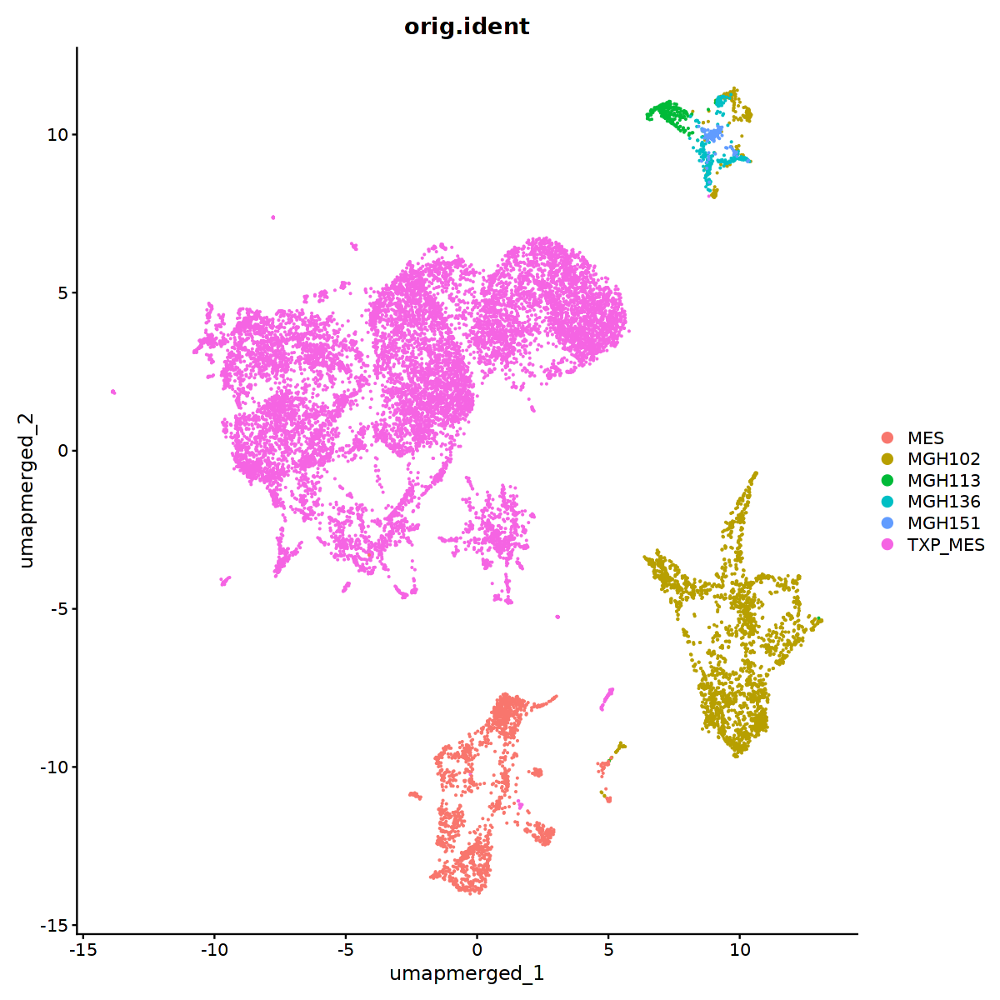

In [5]:
data <- merge(x = GBO.txp, y = c(GBM.pt, MES.gbo))

Idents(data) <- 'celltype'
data <- subset(x = data, idents = c("Macrophage","TCell","Oligodendrocyte"), invert = TRUE)

suppressWarnings({
data <- NormalizeData(data, verbose = FALSE)
data <- FindVariableFeatures(data, verbose = FALSE)
data <- ScaleData(data, verbose = FALSE)
data <- RunPCA(data, verbose = FALSE)
data <- RunUMAP(data, reduction = "pca", dims = 1:30, reduction.name = "umap.merged", verbose = FALSE)
})

options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data, reduction="umap.merged", group.by='orig.ident')

# Integrate Data

In [6]:
data <- IntegrateLayers(
  object = data, method = CCAIntegration,
  orig.reduction = "pca", new.reduction = "integrated.cca",
  verbose = FALSE)

data <- FindNeighbors(data, reduction = "integrated.cca", dims = 1:30, verbose = FALSE)
data <- FindClusters(data, resolution = 0.25, cluster.name = "cca_clusters", verbose = FALSE)
data <- RunUMAP(data, reduction = "integrated.cca", dims = 1:30, reduction.name = "umap.integrated.cca", verbose = FALSE)

Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


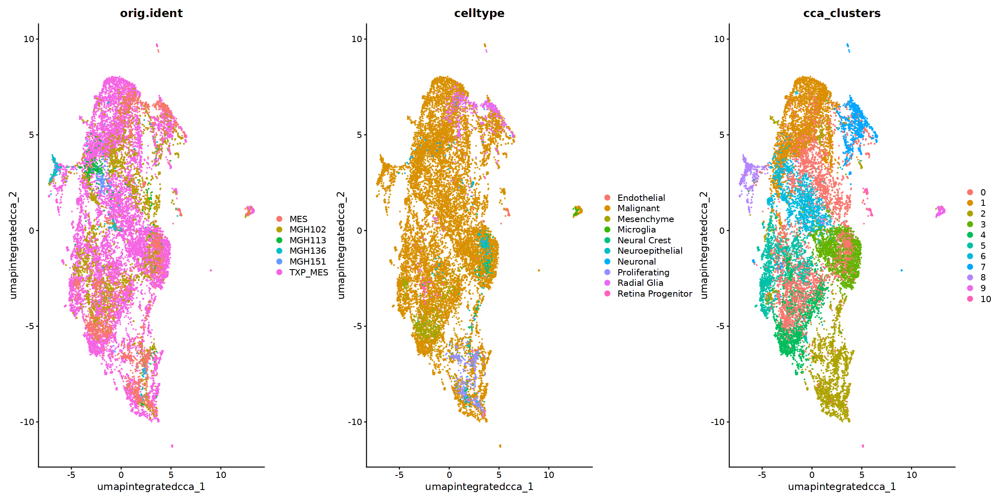

In [7]:
p1 <- DimPlot(data, reduction="umap.integrated.cca", group.by='orig.ident')
p2 <- DimPlot(data, reduction="umap.integrated.cca", group.by='celltype')
p3 <- DimPlot(data, reduction="umap.integrated.cca", group.by='cca_clusters')

options(repr.plot.width=20, repr.plot.height=10)
p1 | p2 | p3

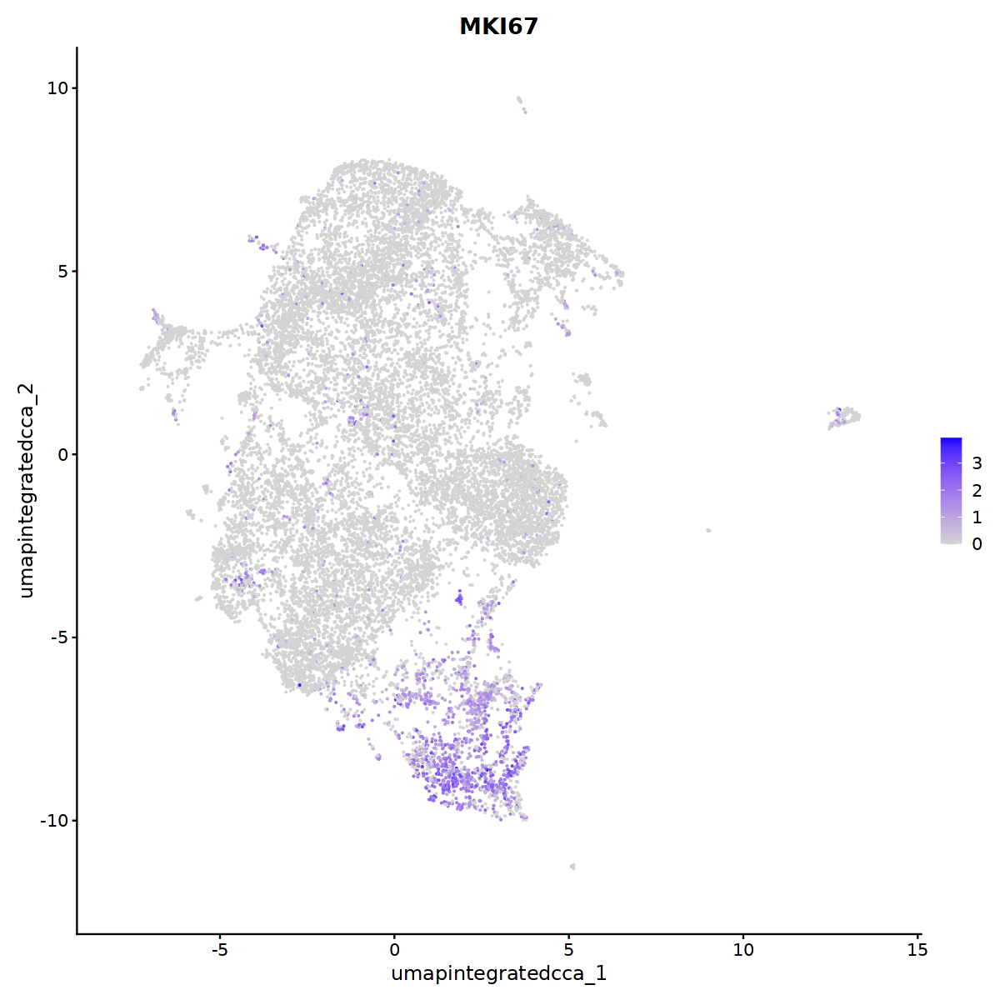

In [8]:
options(repr.plot.width=10, repr.plot.height=10)
FeaturePlot(data, reduction="umap.integrated.cca", features='MKI67')

In [9]:
saveRDS(data, file = "GBMProject/GBMOrganoid/Checkpoints/4a_MESint_pt.rds")

# Monocle3 - Psuedotime

In [10]:
DefaultAssay(data) <- 'RNA'
data <- JoinLayers(data)

data.cds <- as.cell_data_set(data)
data.cds

Warning message:
“Monocle 3 trajectories require cluster partitions, which Seurat does not calculate. Please run 'cluster_cells' on your cell_data_set object”


class: cell_data_set 
dim: 40758 17363 
metadata(0):
assays(2): counts logcounts
rownames(40758): MIR1302-2HG AL627309.1 ... MAGEA4-AS1 LINC00266-4P
rowData names(0):
colnames(17363): AAACCCAAGAGGCGGA-1_3 AAACCCAAGATACCAA-1_3 ...
  TTTGTTGAGGACAGCT-1 TTTGTTGGTACCATAC-1
colData names(51): orig.ident nCount_RNA ... ident Size_Factor
reducedDimNames(4): PCA UMAP.MERGED INTEGRATED.CCA UMAP.INTEGRATED.CCA
mainExpName: RNA
altExpNames(0):

In [11]:
data.cds <- preprocess_cds(data.cds, num_dim = 30)
data.cds <- align_cds(data.cds, alignment_group = "orig.ident")
data.cds <- reduce_dimension(data.cds)#, reduction_method = 'UMAP', verbose = FALSE)
data.cds@int_colData@listData[["reducedDims"]][["UMAP"]] <-data@reductions[["umap.integrated.cca"]]@cell.embeddings
data.cds <- cluster_cells(data.cds)

Aligning cells from different batches using Batchelor.
Please remember to cite:
	 Haghverdi L, Lun ATL, Morgan MD, Marioni JC (2018). 'Batch effects in single-cell RNA-sequencing data are corrected by matching mutual nearest neighbors.' Nat. Biotechnol., 36(5), 421-427. doi: 10.1038/nbt.4091

Warning message in (function (query, X, clust_centers, clust_info, dtype, nn, get_index, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
Warning message in (function (query, X, clust_centers, clust_info, dtype, nn, get_index, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
Warning message in (function (query, X, clust_centers, clust_info, dtype, nn, get_index, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
Warning message in (function (query, X, clust_centers, clust_info, dtype, nn, get_index, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
No preprocess_method specified, and aligned coordinates have been computed pre

In [12]:
data.cds <- learn_graph(data.cds, use_partition=TRUE)#, learn_graph_control=list(ncenter=100), verbose=FALSE) 

  |======================================================================| 100%


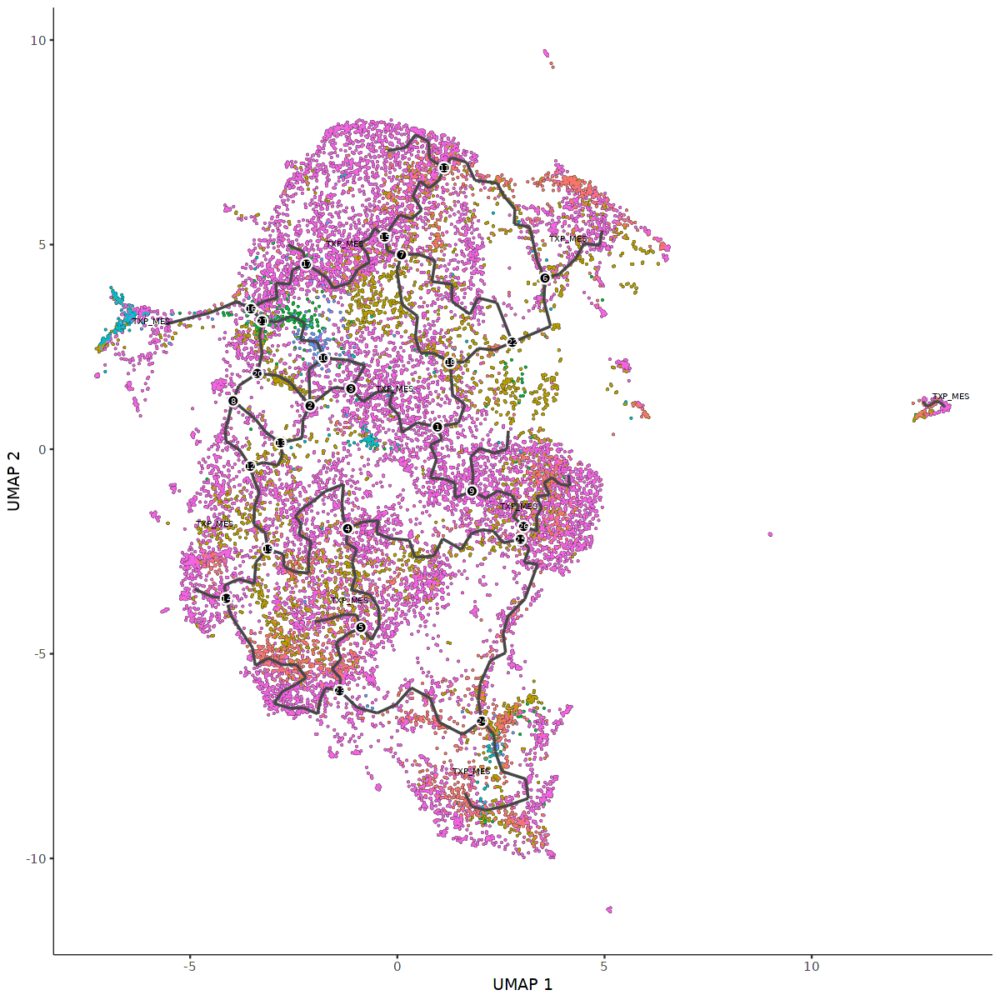

In [13]:
options(repr.plot.width=10, repr.plot.height=10)
plot_cells(data.cds,color_cells_by="orig.ident", label_groups_by_cluster=TRUE, label_leaves=FALSE, label_branch_points=TRUE)

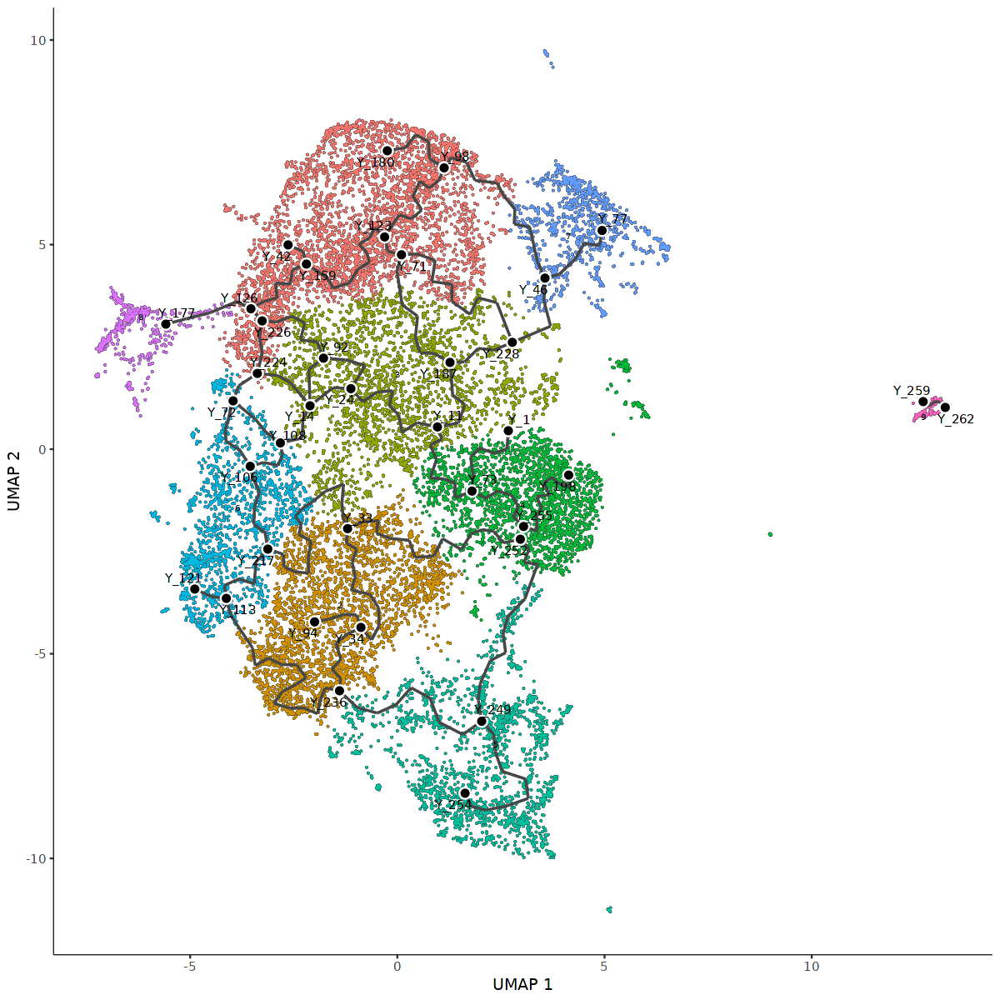

In [14]:
options(repr.plot.width=10, repr.plot.height=10)
plot_cells(data.cds,color_cells_by = "cluster", label_groups_by_cluster=TRUE,label_principal_points = TRUE) #use to pick starting node

Cells aren't colored in a way that allows them to be grouped.



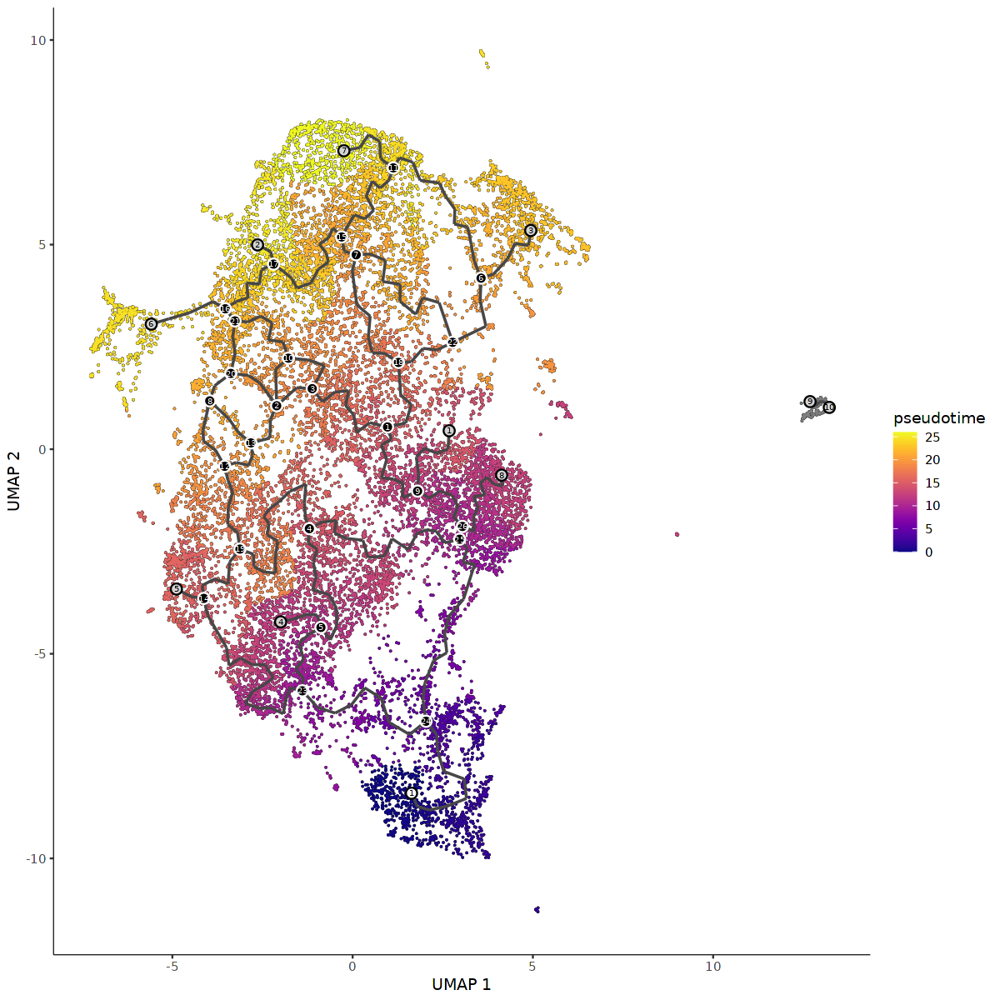

In [15]:
#order cells
data.cds <- order_cells(data.cds, reduction_method = "UMAP",root_pr_nodes='Y_254') #pick node Y_254

# plot trajectories colored by pseudotime
options(repr.plot.width=10, repr.plot.height=10)
plot_cells(cds = data.cds,  color_cells_by = "pseudotime", show_trajectory_graph = TRUE)

In [16]:
#testmarkers for top regulated features
marker_test_res <- top_markers(data.cds, group_cells_by="cluster",  reference_cells=1000, cores=2)
write.csv(marker_test_res, "GBMProject/GBMOrganoid/GeneLists/PT_clustermarkergenes_MES.csv")

  |=======================================================| 100%, Elapsed 00:11
  |=======================================================| 100%, Elapsed 00:17


In [17]:
#Monocle Differential Gene Expression
modulated_genes <- graph_test(data.cds, neighbor_graph = "principal_graph", cores = 4)
write.csv(modulated_genes, "GBMProject/GBMOrganoid/GeneLists/PT_modulatedgenes_MES.csv")

  |=======================================================| 100%, Elapsed 20:45


In [18]:
genes <- row.names(subset(modulated_genes, q_value == 0 & morans_I > 0.4))

pt.matrix <- exprs(data.cds)[match(genes,rownames(rowData(data.cds))),order(pseudotime(data.cds))]
#Can also use "normalized_counts" instead of "exprs" to use various normalization methods, for example: normalized_counts(cds, norm_method = "log")

pt.matrix <- t(apply(pt.matrix,1,function(x){smooth.spline(x,df=3)$y}))
pt.matrix <- t(apply(pt.matrix,1,function(x){(x-mean(x))/sd(x)}))
rownames(pt.matrix) <- genes;
write.csv(pt.matrix, "GBMProject/GBMOrganoid/GeneLists/PT_matrix_MES.csv")

`use_raster` is automatically set to TRUE for a matrix with more than
2000 columns You can control `use_raster` argument by explicitly
setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



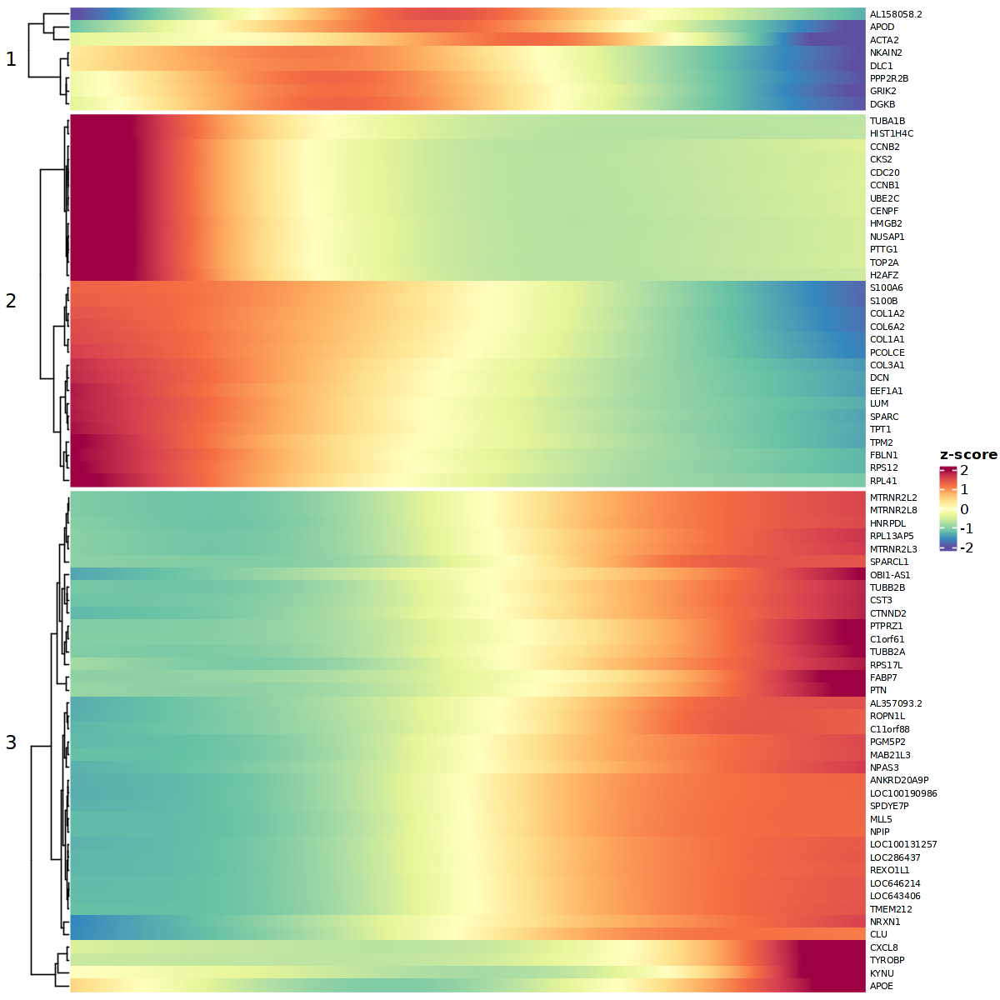

In [19]:
#K means with 2 groups
htkm <- draw(Heatmap(
  pt.matrix,
  name                         = "z-score",
  col                          = colorRamp2(seq(from=-2,to=2,length=11),rev(brewer.pal(11, "Spectral"))),
  show_row_names               = TRUE,
  show_column_names            = FALSE,
  row_names_gp                 = gpar(fontsize = 6),
  km = 3,
  row_title_rot                = 0,
  cluster_rows                 = TRUE,
  cluster_row_slices           = FALSE,
  cluster_columns              = FALSE))

In [21]:
#Extract the pseudotime values and pseudotimegroup to add the Seurat object
clusters <- clusters(data.cds)
data <- AddMetaData(object = data, metadata = clusters, col.name = "pt_clusters")

pt <-data.cds@principal_graph_aux@listData$UMAP$pseudotime
data <- AddMetaData(object = data, metadata = pt, col.name = "pseudotime")

In [77]:
# Make Psuedotime Bins
datapseudotime<-data.frame(pseudotime(data.cds))
colnames(datapseudotime) <- c("grouppseudotime")
datapseudotime <- datapseudotime %>%  filter(grouppseudotime!='Inf')
filtereddatapseudotime <- datapseudotime[['grouppseudotime']]
filtereddatapseudotime$bin <- as.numeric(cut(filtereddatapseudotime,10)) #last number is number of bins

datapseudotime$bin <- filtereddatapseudotime$bin
datapseudotime$grouppseudotime <- NULL

data <- AddMetaData(object = data, metadata = datapseudotime, col.name = "pt_bin")

Warning message in filtereddatapseudotime$bin <- as.numeric(cut(filtereddatapseudotime, :
“Coercing LHS to a list”


In [22]:
genelists <- read.csv("GBMProject/GBMOrganoid/Modules.csv", header = TRUE)

#Neftel States Modules
mes1.genelist <- genelists$Neftel_MES1[1:50]
mes2.genelist <- genelists$Neftel_MES2[1:50]
ac.genelist <- genelists$Neftel_AC[1:39]
opc1.genelist <- genelists$Neftel_OPC[1:50]
npc1.genelist <- genelists$Neftel_NPC1[1:50]
npc2.genelist <- genelists$Neftel_NPC2[1:50]
  
data <- AddModuleScore(data, features = list(mes1.genelist), name = "Neftel_MES1", search = TRUE)
data <- AddModuleScore(data, features = list(mes2.genelist), name = "Neftel_MES2", search = TRUE)
data <- AddModuleScore(data, features = list(ac.genelist), name = "Neftel_AC", search = TRUE)
data <- AddModuleScore(data, features = list(opc1.genelist), name = "Neftel_OPC", search = TRUE)
data <- AddModuleScore(data, features = list(npc1.genelist), name = "Neftel_NPC1", search = TRUE)
data <- AddModuleScore(data, features = list(npc2.genelist), name = "Neftel_NPC2", search = TRUE)

#Barkley Cancer Cell State Modules
cycle.genelist <- genelists$Barkley_Cycle[1:297]
stress.genelist <- genelists$Barkley_Stress[1:233]
interferon.genelist <- genelists$Barkley_Interferon[1:136]
hypoxia.genelist <- genelists$Barkley_Hypoxia[1:46]
oxphos.genelist <- genelists$Barkley_Oxphos[1:24]
metal.genelist <- genelists$Barkley_Metal[1:9]
mes3.genelist <- genelists$Barkley_Mesenchymal[1:18]
pemt.genelist <- genelists$Barkley_pEMT[1:144]
alveolar.genelist <- genelists$Barkley_Alveolar[1:16]
basal.genelist <- genelists$Barkley_Basal[1:33]
squamous.genelist <- genelists$Barkley_Squamous[1:64]
gland.genelist <- genelists$Barkley_Glandular[1:70]
cilia.genelist <- genelists$Barkley_Ciliated[1:39]
ac2.genelist <- genelists$Barkley_AC[1:35]
opc3.genelist <- genelists$Barkley_OPC[1:8]
npc3.genelist <- genelists$Barkley_NPC[1:30]

data <- AddModuleScore(data, features = list(cycle.genelist), name = "Barkley_Cycle", search = TRUE) #cycling
data <- AddModuleScore(data, features = list(stress.genelist), name = "Barkley_Stress", search = TRUE) #stress
data <- AddModuleScore(data, features = list(interferon.genelist), name = "Barkley_Interferon", search = TRUE) #interferon
data <- AddModuleScore(data, features = list(hypoxia.genelist), name = "Barkley_Hypoxia", search = TRUE) #hypoxia
data <- AddModuleScore(data, features = list(oxphos.genelist), name = "Barkley_Oxphos", search = TRUE) #oxidative phosphorylation
data <- AddModuleScore(data, features = list(metal.genelist), name = "Barkley_Metal", search = TRUE) #metal
data <- AddModuleScore(data, features = list(mes3.genelist), name = "Barkley_Mesenchymal", search = TRUE) #Mesenchymal
data <- AddModuleScore(data, features = list(pemt.genelist), name = "Barkley_pEMT", search = TRUE) #partial EMT
data <- AddModuleScore(data, features = list(alveolar.genelist), name = "Barkley_Alveolar", search = TRUE) #alveolar
data <- AddModuleScore(data, features = list(basal.genelist), name = "Barkley_Basal", search = TRUE) #basal
data <- AddModuleScore(data, features = list(squamous.genelist), name = "Barkley_Squamous", search = TRUE) #squamous
data <- AddModuleScore(data, features = list(gland.genelist), name = "Barkley_Glandular", search = TRUE) #glandular
data <- AddModuleScore(data, features = list(cilia.genelist), name = "Barkley_Ciliated", search = TRUE) #ciliated
data <- AddModuleScore(data, features = list(ac2.genelist), name = "Barkley_AC", search = TRUE) #astrocyte
data <- AddModuleScore(data, features = list(opc3.genelist), name = "Barkley_OPC", search = TRUE) #oligodendrocyte progenitor
data <- AddModuleScore(data, features = list(npc3.genelist), name = "Barkley_NPC", search = TRUE) #neural progenitor

Warning message:
“The following features are not present in the object: IGFL1, attempting to find updated synonyms”
Warning message:
“No updated symbols found”
Warning message:
“The following features are still not present in the object: IGFL1”
Warning message:
“The following features are not present in the object: MUC5AC, attempting to find updated synonyms”
Warning message:
“No updated symbols found”
Warning message:
“The following features are still not present in the object: MUC5AC”


# Analysis

In [22]:
Idents(data) <- "pt_clusters"
cluster.markers <- FindAllMarkers(data, only.pos=TRUE, min.pct=0.25)
write.csv(cluster.markers, file = "GBMProject/GBMOrganoid/GeneLists/clustermarkers_pt_MES.csv")

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9



In [83]:
meta_column = c()
length = ncol(data)
count = 1
while (count <= length) {
  if(data$orig.ident[count] %in% c("MES")){
    value = data$celltype[count]
  }
  else if(data$orig.ident[count] %in% c("TXP_MES")){
    value = "eGBO_Tumor"
  }
  else{
    value = "PT_Tumor"
  }
      
  meta_column = append(meta_column, value)
  count = count + 1
}

names(meta_column) <- colnames(x = data)
data <- AddMetaData(object = data, metadata = meta_column, col.name = "celltype2")

In [18]:
pt.modules <- read.csv("GBMProject/GBMOrganoid/PTModules_MES.csv", header = TRUE)

#Neftel States Modules
pt1.genelist <- pt.modules$ptCluster1[1:29]
pt2.genelist <- pt.modules$ptCluster2[1:8]
pt3.genelist <- pt.modules$ptCluster3[1:39]
  
data <- AddModuleScore(data, features = list(pt1.genelist), name = "ptEarlyscore", search = TRUE)
data <- AddModuleScore(data, features = list(pt2.genelist), name = "ptInterscore", search = TRUE)
data <- AddModuleScore(data, features = list(pt3.genelist), name = "ptLatescore", search = TRUE)

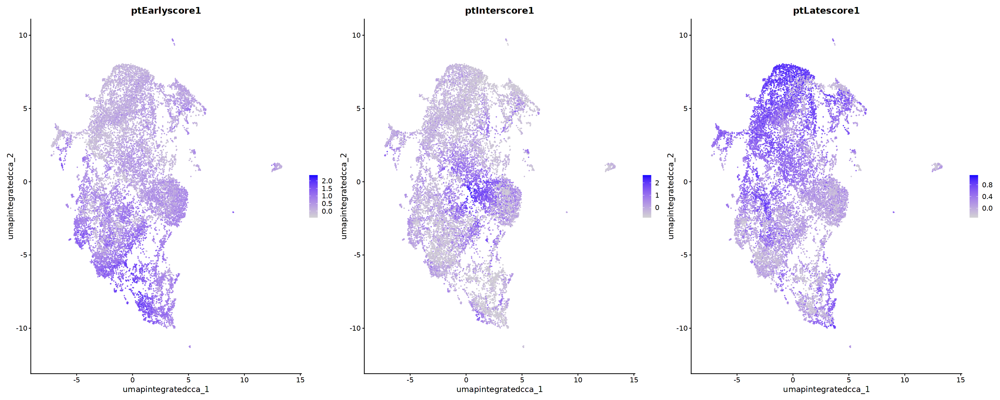

In [21]:
options(repr.plot.width=25, repr.plot.height=10)
FeaturePlot(data, c("ptEarlyscore1","ptInterscore1","ptLatescore1"), reduction="umap.integrated.cca", ncol=3, pt.size = 0.1) 

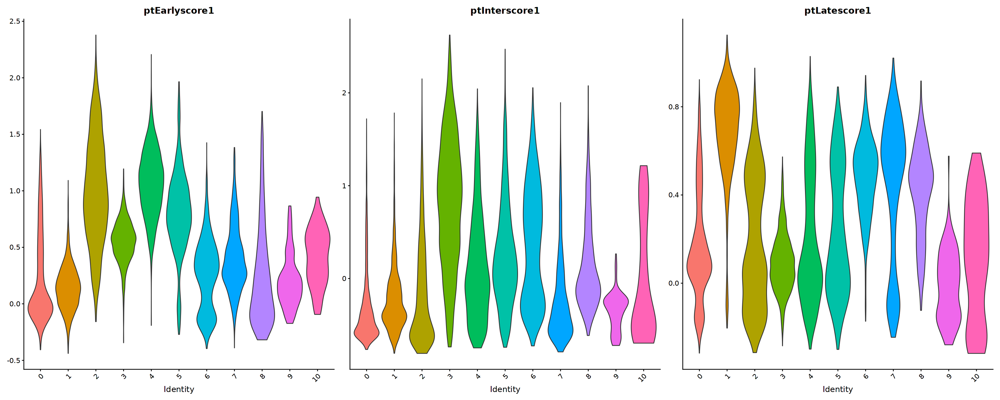

In [25]:
options(repr.plot.width=25, repr.plot.height=10)
VlnPlot(data, c("ptEarlyscore1","ptInterscore1","ptLatescore1"), group.by="cca_clusters", ncol=3, pt.size = 0) 

# Save Checkpoint

In [100]:
meta_column = c()
length = ncol(data)
count = 1
while (count <= length) {
  if(data$orig.ident[count] %in% c("MES")){
    value = data$celltype[count]
  }
  else if(data$orig.ident[count] %in% c("TXP_MES")){
    value = "eGBO_Tumor"
  }
  else{
    value = "PT_Tumor"
  }
      
  meta_column = append(meta_column, value)
  count = count + 1
}

names(meta_column) <- colnames(x = data)
data <- AddMetaData(object = data, metadata = meta_column, col.name = "celltype2")

In [101]:
saveRDS(data, file = "GBMProject/GBMOrganoid/Checkpoints/4b_MonoclePT-MES_seurat.rds")
saveRDS(data.cds, file = "GBMProject/GBMOrganoid/Checkpoints/4b_MonoclePT-MES_cds.rds")

# Visualizations

In [3]:
data <- readRDS("GBMProject/GBMOrganoid/Checkpoints/4b_MonoclePT-MES_seurat.rds")
data.cds <- readRDS("GBMProject/GBMOrganoid/Checkpoints/4b_MonoclePT-MES_cds.rds")

pt.matrix.mes <- as.matrix(read.csv("GBMProject/GBMOrganoid/GeneLists/PT_matrix_MES.csv",skip = 1, row.names=1, header = FALSE))
colnames(pt.matrix.mes)<-NULL

modulated_genes <- read.csv("GBMProject/GBMOrganoid/GeneLists/PT_modulatedgenes_MES.csv", row.names=1)
genes <- row.names(subset(modulated_genes, q_value == 0 & morans_I > 0.4))

In [75]:
# Make Psuedotime Bins
datapseudotime<-data.frame(pseudotime(data.cds))
colnames(datapseudotime) <- c("grouppseudotime")
datapseudotime <- datapseudotime %>%  filter(grouppseudotime!='Inf')
filtereddatapseudotime <- datapseudotime[['grouppseudotime']]
filtereddatapseudotime$bin <- as.numeric(cut(filtereddatapseudotime,10)) #last number is number of bins

datapseudotime$bin <- filtereddatapseudotime$bin
datapseudotime$grouppseudotime <- NULL

data <- AddMetaData(object = data, metadata = datapseudotime, col.name = "pt_bin")

Warning message in filtereddatapseudotime$bin <- as.numeric(cut(filtereddatapseudotime, :
“Coercing LHS to a list”


In [76]:
data <- AddMetaData(object = data, metadata = datapseudotime, col.name = "pt_bin")

In [95]:
Idents(data) <- 'celltype2'
levels(data)

[1] "eGBO_Tumor"        "PT_Tumor"          "Proliferating"    
 [4] "Radial Glia"       "Mesenchyme"        "Neural Crest"     
 [7] "Neuroepithelial"   "Retina Progenitor" "Neuronal"         
[10] "Microglia"         "Endothelial"

In [96]:
# Calculate cell type proportions
prop.celltype <- data.frame(prop.table(table(data$celltype2,data$pt_bin)))

colnames(prop.celltype) <- c("CellType","Bin", "Frac")
prop.celltype$CellType <- as.character(prop.celltype$CellType)
prop.celltype$Bin <- as.character(prop.celltype$Bin)

prop.celltype$CellType <- factor(prop.celltype$CellType, levels=c("PT_Tumor","eGBO_Tumor","Proliferating","Radial Glia","Mesenchyme","Neural Crest",
                                                                  "Neuroepithelial","Retina Progenitor","Neuronal","Microglia","Endothelial"))
prop.celltype$Bin <- factor(prop.celltype$Bin, levels=c("1","2","3","4","5","6","7","8","9","10"))

In [ ]:
myColors <- c("dimgray","skyblue3","mediumpurple1","navyblue",
              "lightcoral","lightseagreen","goldenrod1","lightgreen","gray")

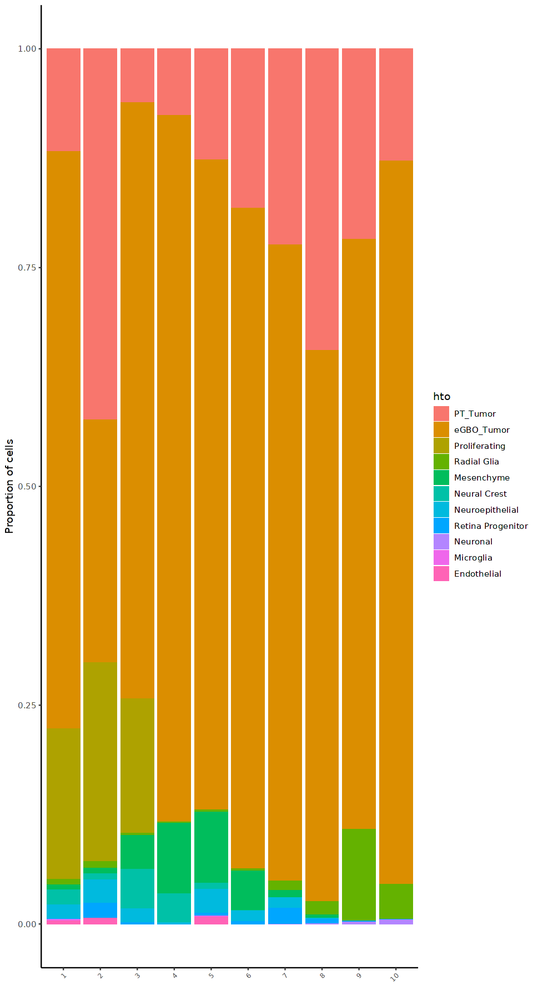

In [97]:
options(repr.plot.width = 8, repr.plot.height = 15)

prop.plot <- ggplot(prop.celltype, aes(fill=factor(CellType), y=Frac, x=Bin)) +
  geom_bar(position="fill", stat="identity", width = .9) +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1, size = 7)) +
  labs(x = "", y = "Proportion of cells") +
  guides(fill = guide_legend(title="hto"))
  #scale_fill_manual(values=c("forestgreen","mediumorchid","dodgerblue3")) + NoLegend()

prop.plot

In [87]:
gene_module_df <- find_gene_modules(data.cds[genes,], resolution=0.5)

In [14]:
write.csv(gene_module_df, file = "GBMProject/GBMOrganoid/GeneLists/PTmodules_MES.csv")

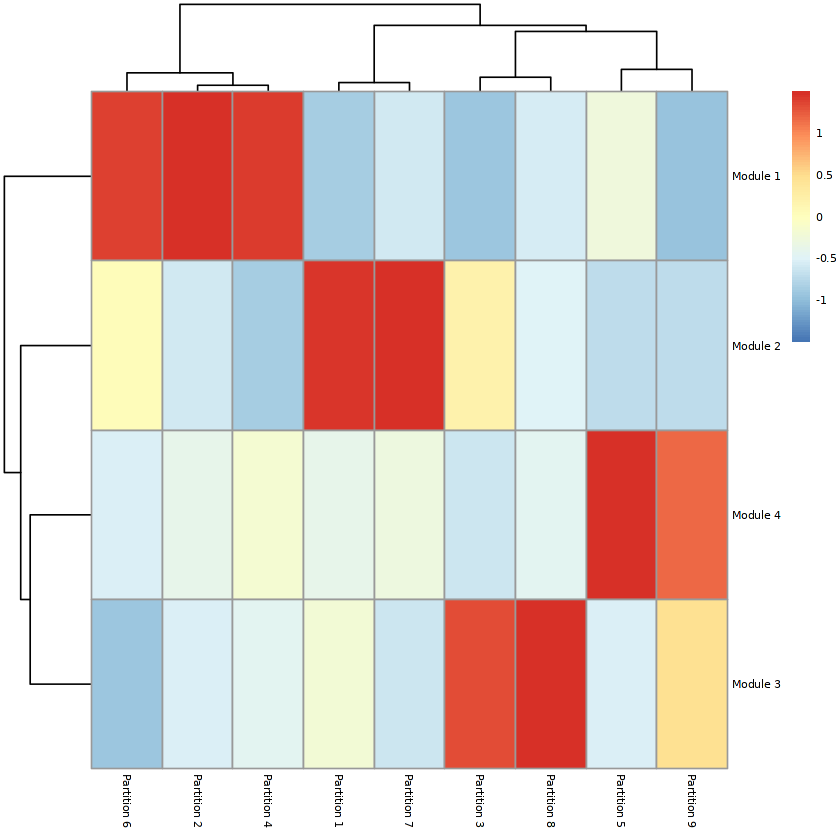

In [11]:
cell_group_df <- tibble::tibble(cell=row.names(colData(data.cds)), 
                                cell_group=clusters(data.cds)[colnames(data.cds)])
agg_mat <- aggregate_gene_expression(data.cds, gene_module_df, cell_group_df)
row.names(agg_mat) <- stringr::str_c("Module ", row.names(agg_mat))
colnames(agg_mat) <- stringr::str_c("Partition ", colnames(agg_mat))

pheatmap::pheatmap(agg_mat, cluster_rows=TRUE, cluster_cols=TRUE,
                   scale="column", clustering_method="ward.D2",
                   fontsize=6)

In [22]:
modules <- split(gene_module_df, f = gene_module_df$module)
mod1 <- modules[[1]][['id']]
mod2 <- modules[[2]][['id']]
mod3 <- modules[[3]][['id']]
mod4 <- modules[[4]][['id']]

data <- AddModuleScore(data, features = mod1, name = "Mod1Score", search = TRUE)
data <- AddModuleScore(data, features = mod2, name = "Mod2Score", search = TRUE)
data <- AddModuleScore(data, features = mod3, name = "Mod3Score", search = TRUE)
data <- AddModuleScore(data, features = mod4, name = "Mod4Score", search = TRUE)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


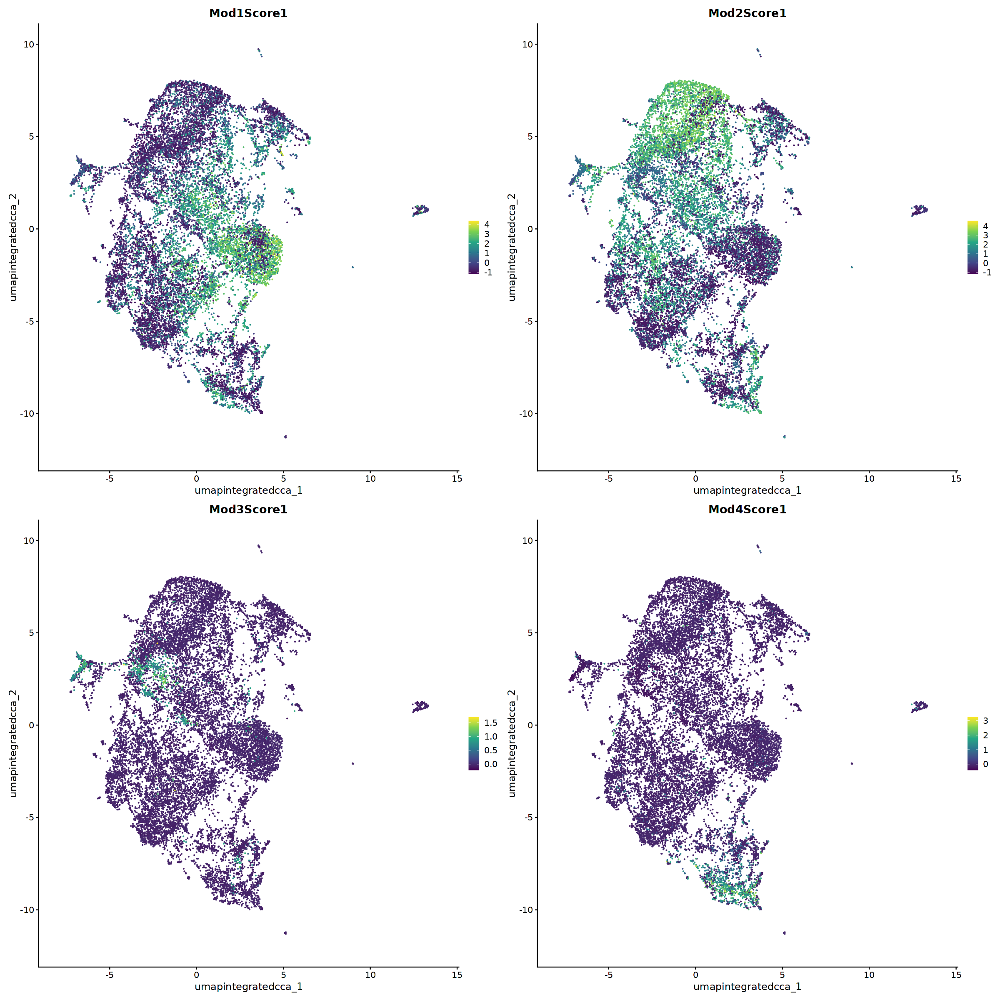

In [23]:
options(repr.plot.width=20, repr.plot.height=20)
FeaturePlot(data, c("Mod1Score1","Mod2Score1","Mod3Score1","Mod4Score1"), ncol=2, reduction="umap.integrated.cca", pt.size = 0.1) & scale_color_viridis_c() 

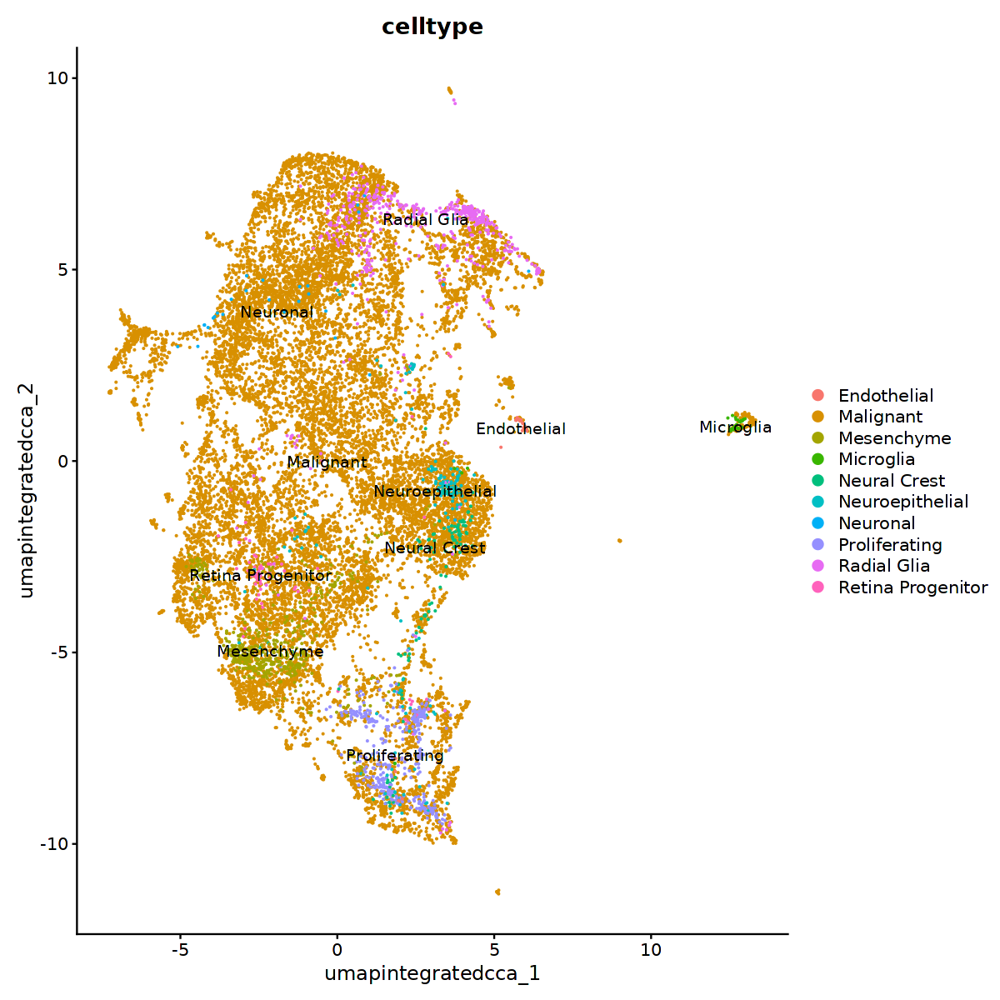

In [16]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data, reduction="umap.integrated.cca", group.by="celltype", label=T)

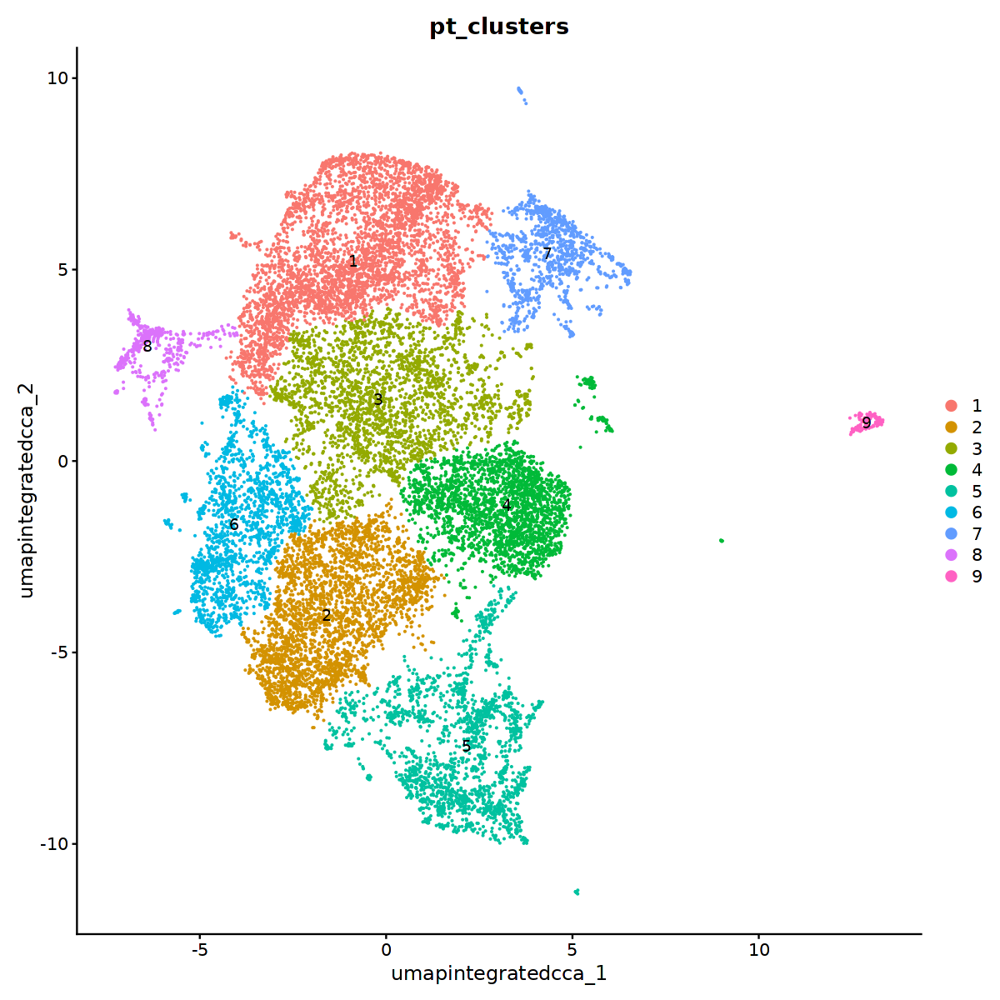

In [17]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data, reduction="umap.integrated.cca", group.by="pt_clusters", label=T)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


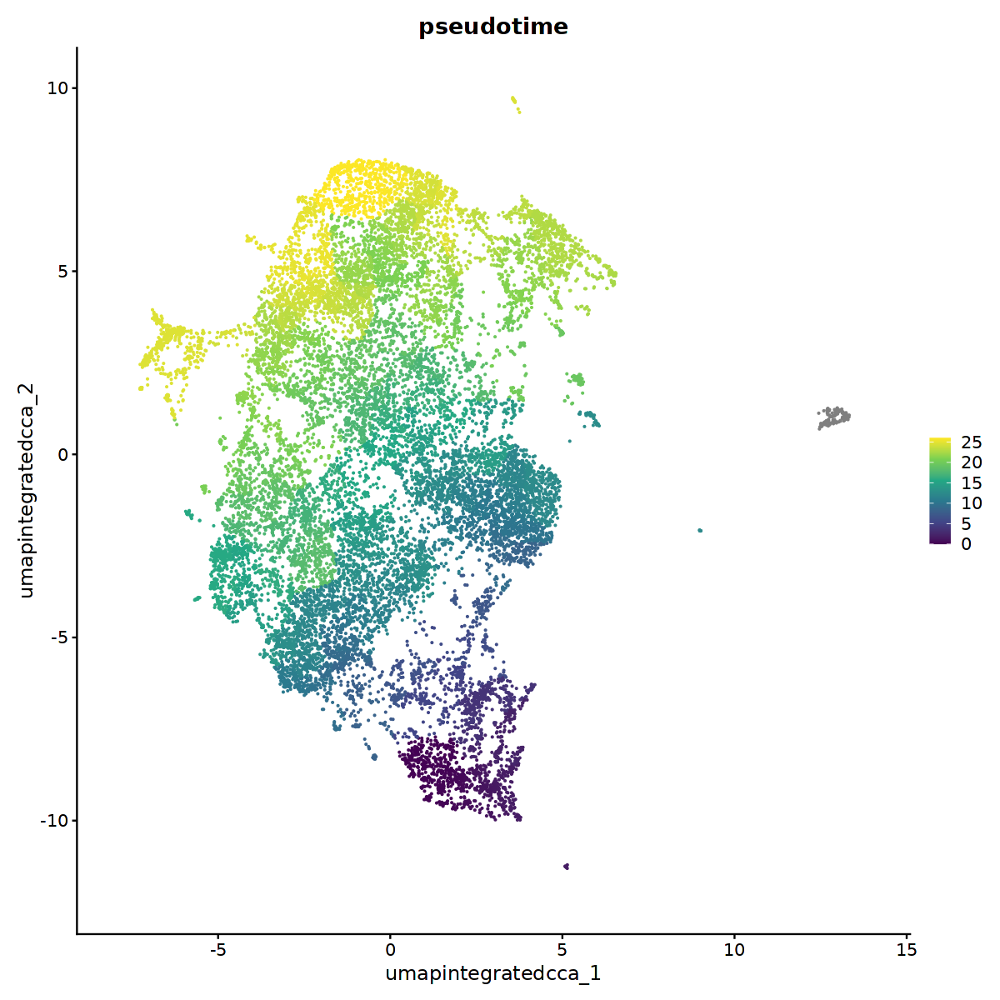

In [18]:
options(repr.plot.width=10, repr.plot.height=10)
FeaturePlot(data, c("pseudotime"), reduction="umap.integrated.cca", pt.size = 0.1) & scale_color_viridis_c() 

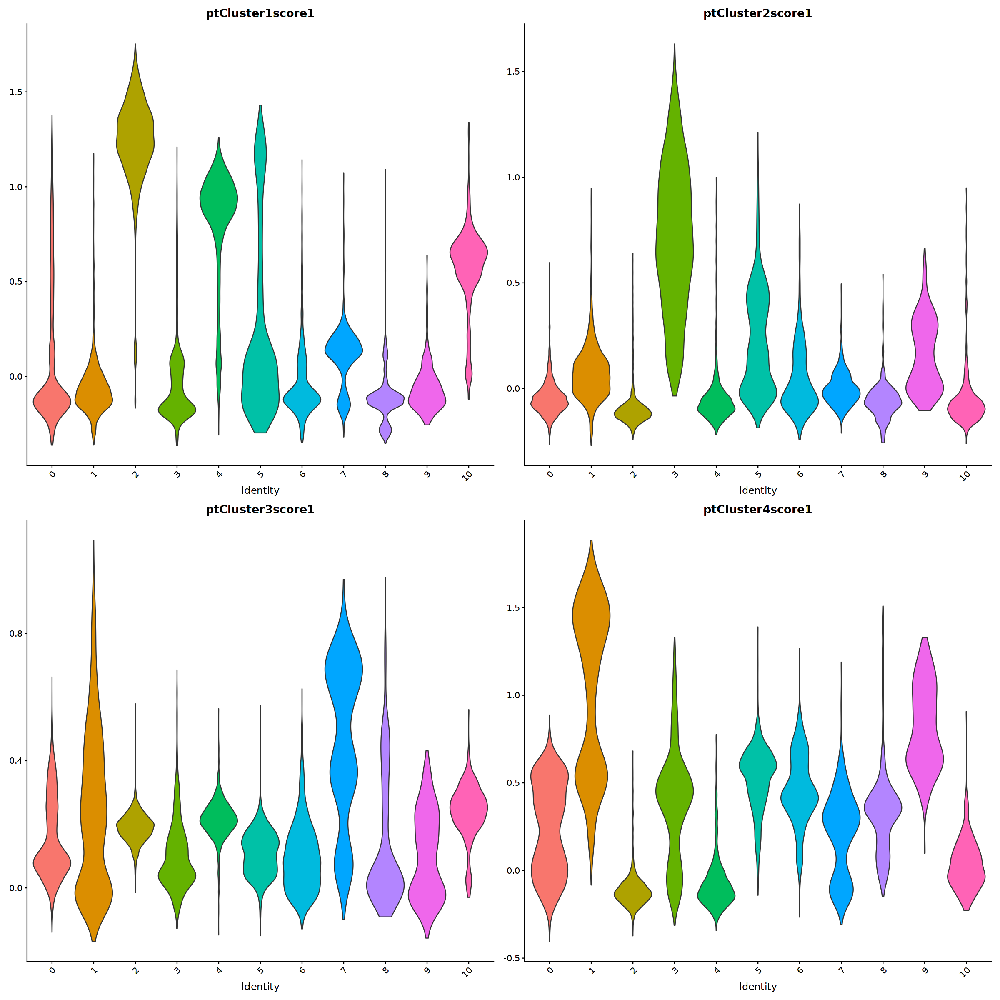

In [54]:
options(repr.plot.width=20, repr.plot.height=20)
VlnPlot(data, group.by = "cca_clusters", features =  c("ptCluster1score1","ptCluster2score1","ptCluster3score1","ptCluster4score1"), 
            ncol = 2, pt.size=0) #+ NoLegend() + NoAxes() + ggtitle("")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


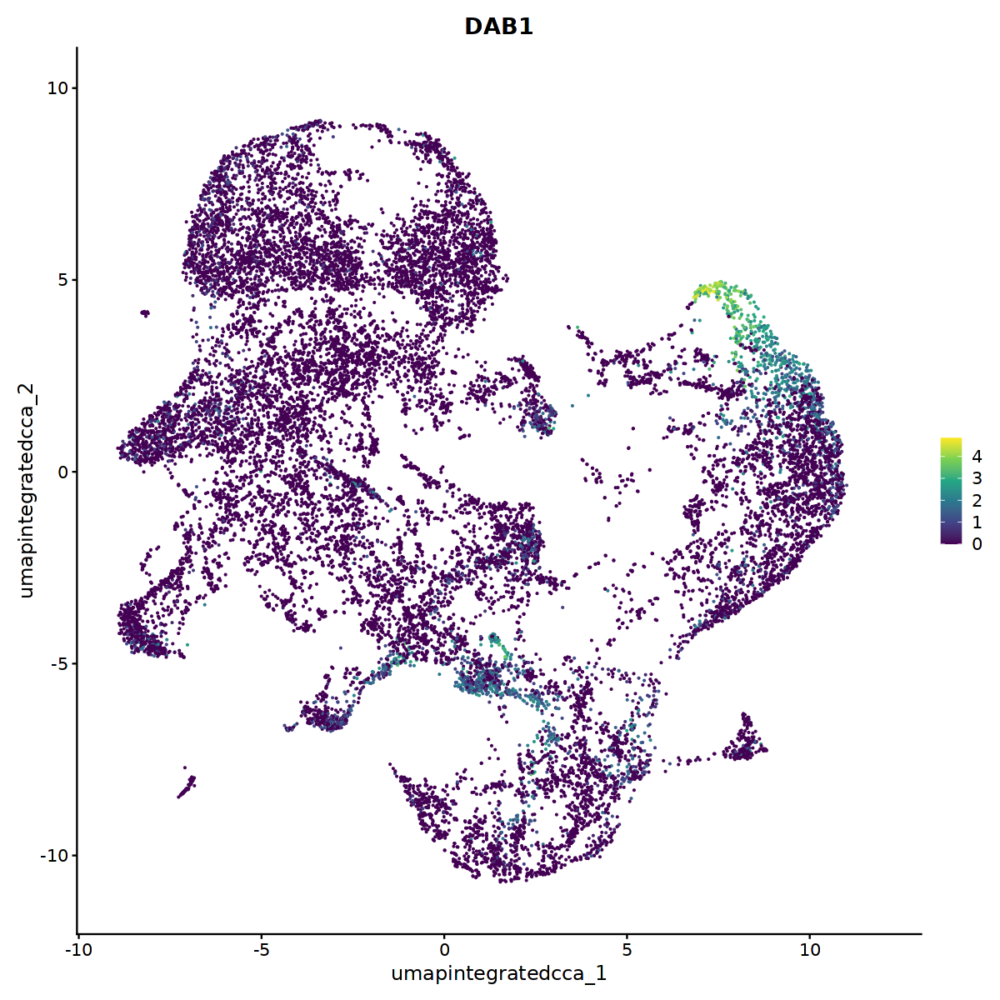

In [44]:
options(repr.plot.width=10, repr.plot.height=10)
FeaturePlot(data, c("DAB1"), reduction="umap.integrated.cca", pt.size = 0.1) & scale_color_viridis_c() 

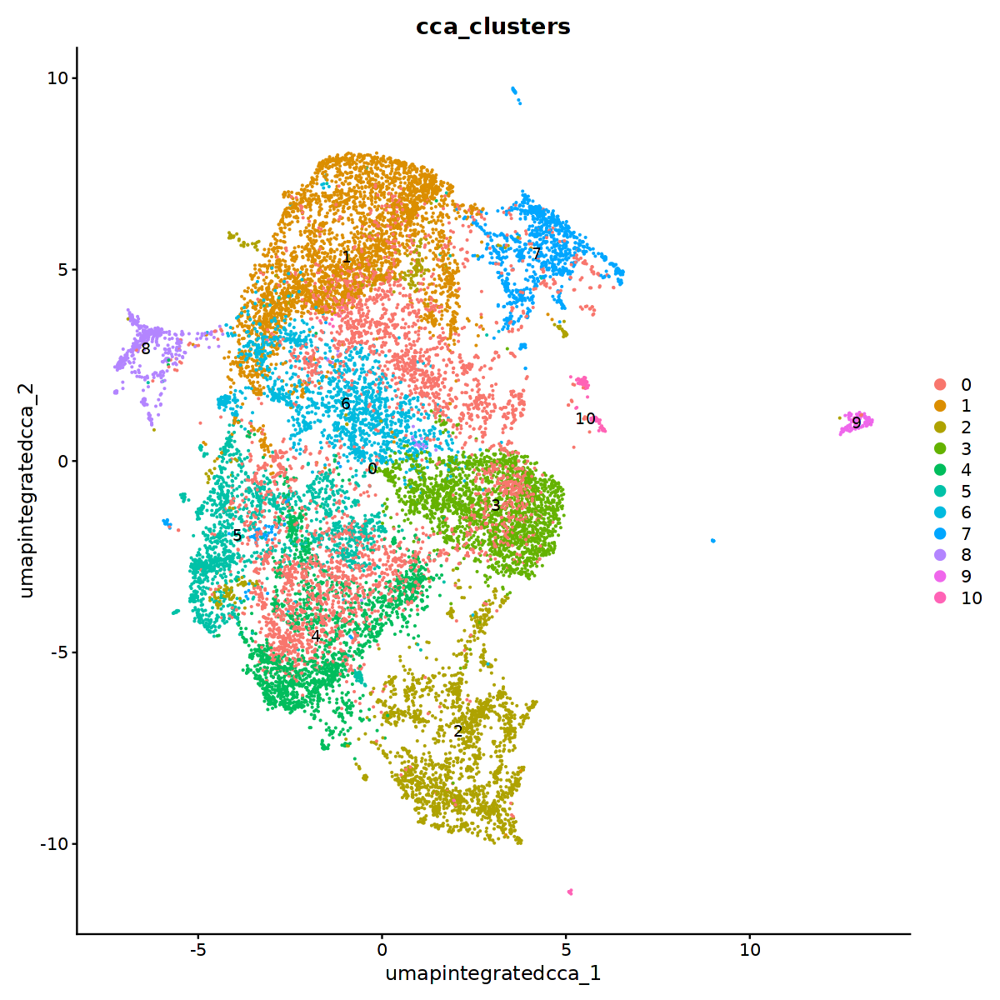

In [17]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data, reduction="umap.integrated.cca", group.by="cca_clusters", label=T)

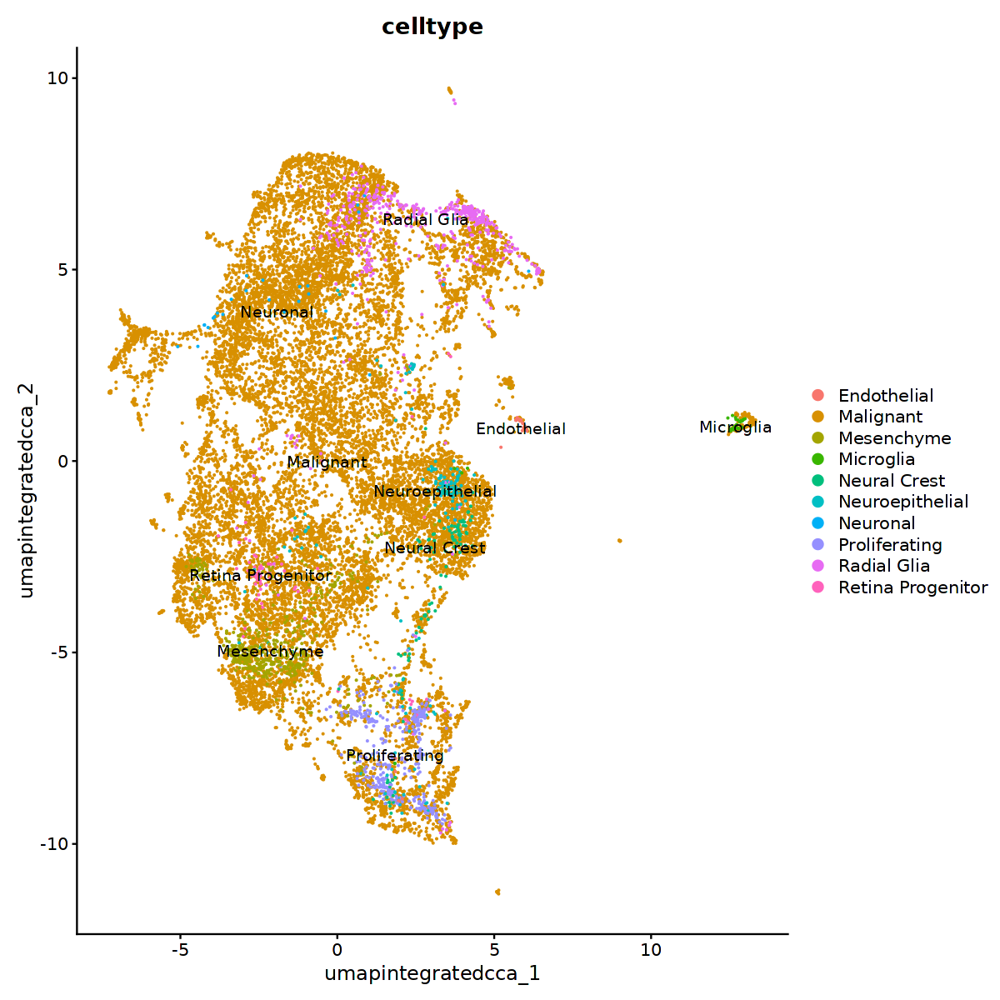

In [26]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(data, reduction="umap.integrated.cca", group.by='celltype', label=T) #+ NoLegend()

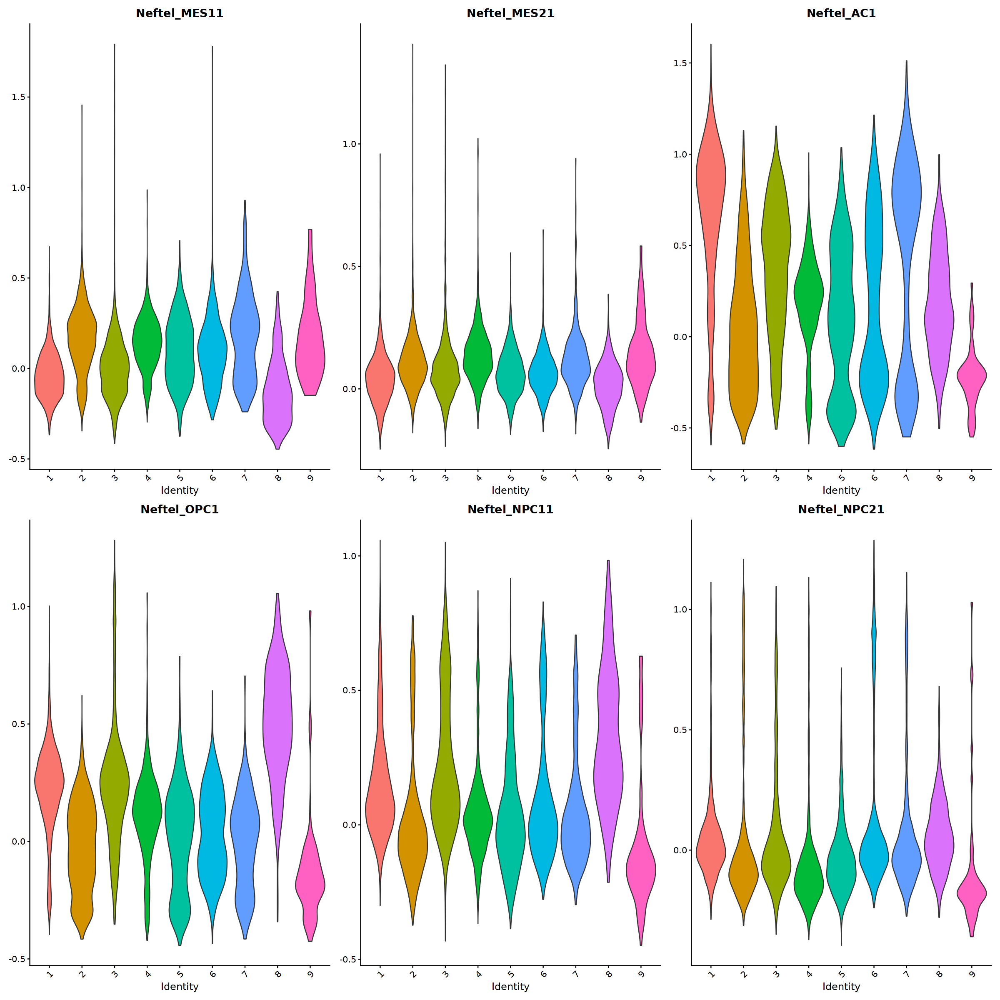

In [21]:
options(repr.plot.width=20, repr.plot.height=20)
VlnPlot(data, group.by = "pt_clusters", features = c('Neftel_MES11','Neftel_MES21','Neftel_AC1',
                                                        'Neftel_OPC1','Neftel_NPC11','Neftel_NPC21'), 
            ncol = 3, pt.size=0) #+ NoLegend() + NoAxes() + ggtitle("")

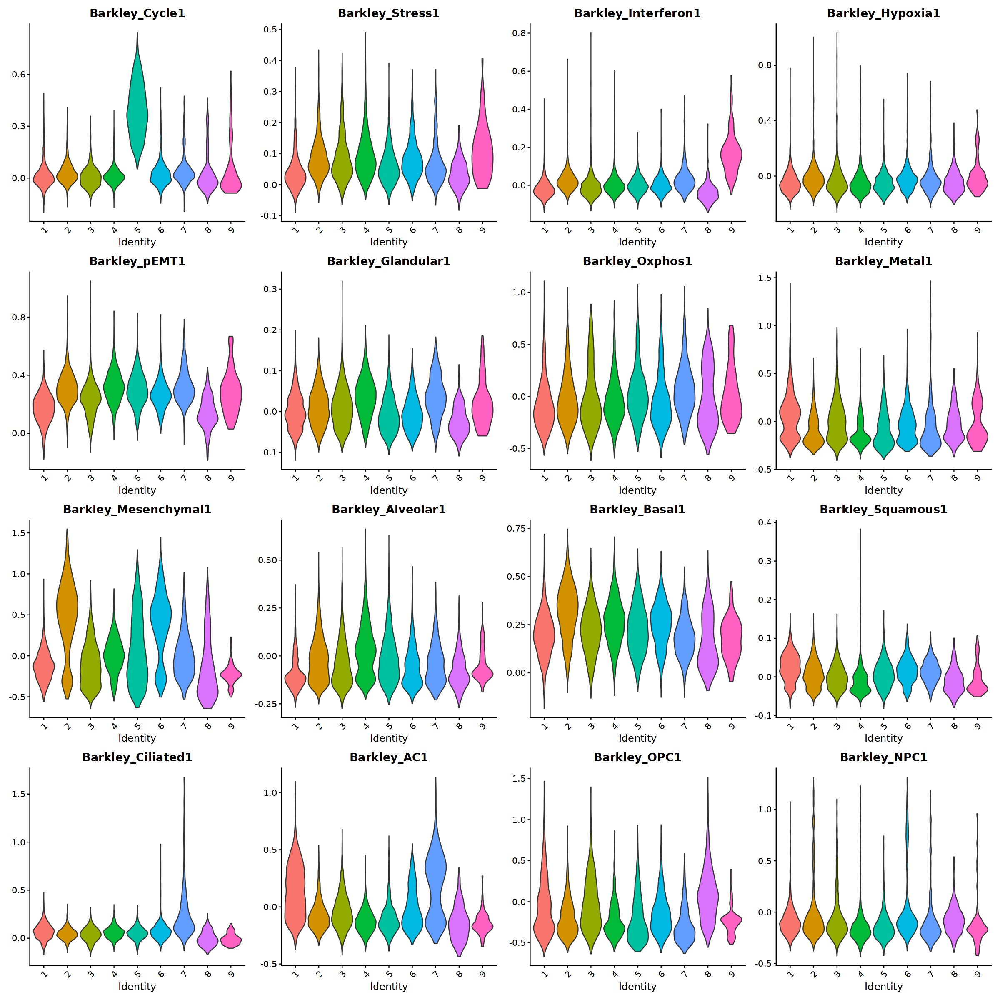

In [20]:
options(repr.plot.width=20, repr.plot.height=20)
VlnPlot(data, group.by = "pt_clusters", features = c('Barkley_Cycle1','Barkley_Stress1','Barkley_Interferon1',
                                                                'Barkley_Hypoxia1','Barkley_pEMT1','Barkley_Glandular1',
                                                                 'Barkley_Oxphos1','Barkley_Metal1','Barkley_Mesenchymal1',
                                                                 'Barkley_Alveolar1','Barkley_Basal1','Barkley_Squamous1',
                                                           'Barkley_Ciliated1','Barkley_AC1','Barkley_OPC1','Barkley_NPC1'), 
            ncol = 4, pt.size=0) #+ NoLegend() + NoAxes() + ggtitle("")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


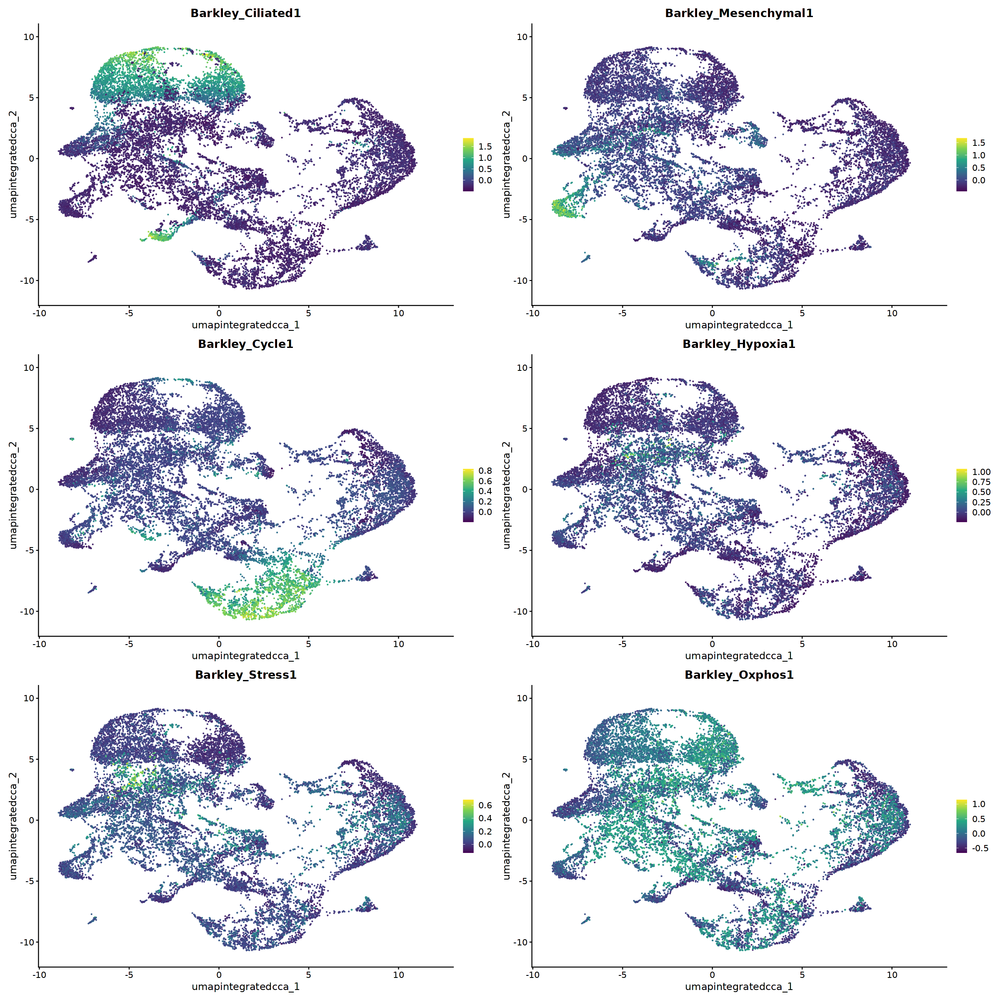

In [33]:
options(repr.plot.width=20, repr.plot.height=20)
FeaturePlot(data, c("Barkley_Ciliated1","Barkley_Mesenchymal1","Barkley_Cycle1","Barkley_Hypoxia1",
                   'Barkley_Stress1','Barkley_Oxphos1'), reduction="umap.integrated.cca", pt.size = 0.1) & scale_color_viridis_c() 